<a href="https://colab.research.google.com/github/Mateusz-best-creator/Learning_PyTorch/blob/main/PyTorch_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computer Vision with PyTorch

In [ ]:
import torch
from torch import nn
import torchvision
from torchvision import datasets
from torchvision import transforms
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

print(torch.__version__)
print(torchvision.__version__)

2.3.1+cu121
0.18.1+cu121


## Getting Dataset

The dataset we are going to use is **Fashion MNIST**.

In [ ]:
train_data = datasets.FashionMNIST(root="data", # Where download our data
                                   train=True,
                                   download=True,
                                   transform=ToTensor(), # How to transform images
                                   target_transform=None) # For labels
test_data = datasets.FashionMNIST(root="data",
                                  train=False,
                                  download=True,
                                  transform=ToTensor(),
                                  target_transform=None)
train_data, test_data

100%|██████████| 26421880/26421880 [00:03<00:00, 8660645.68it/s] 


Extracting data/FashionMNIST/raw/train-images-idx3-ubyte.gz to data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 174816.71it/s]


Extracting data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:02<00:00, 1547628.22it/s]


Extracting data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 21965693.79it/s]

Extracting data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to data/FashionMNIST/raw



(Dataset FashionMNIST
     Number of datapoints: 60000
     Root location: data
     Split: Train
     StandardTransform
 Transform: ToTensor(),
 Dataset FashionMNIST
     Number of datapoints: 10000
     Root location: data
     Split: Test
     StandardTransform
 Transform: ToTensor())

In [ ]:
# See first training example
image, label = train_data[0]
image.shape, label

(torch.Size([1, 28, 28]), 9)

In [ ]:
# Get class names
# 0	T-shirt/top
# 1	Trouser
# 2	Pullover
# 3	Dress
# 4	Coat
# 5	Sandal
# 6	Shirt
# 7	Sneaker
# 8	Bag
# 9	Ankle boot
CLASS_NAMES = train_data.classes
CLASS_NAMES[label]

'Ankle boot'

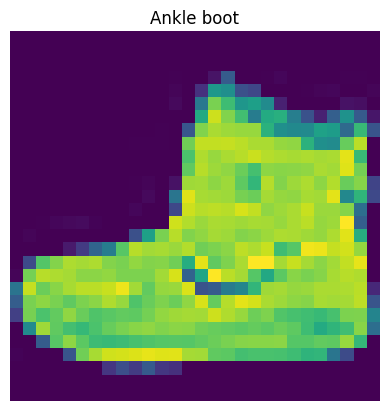

In [ ]:
plt.imshow(image.squeeze())
plt.title(CLASS_NAMES[label])
plt.axis("off")
plt.show()

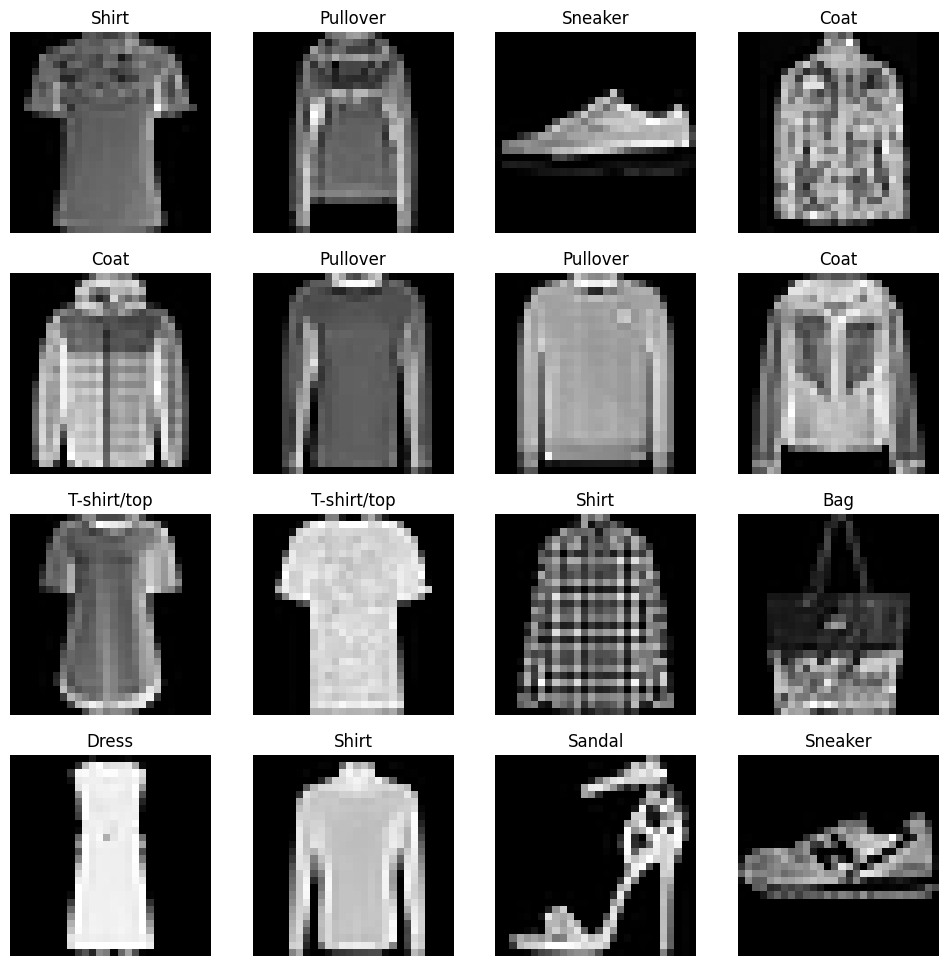

In [ ]:
# Visualize some random images
fig = plt.figure(figsize=(12, 12))
rows, cols = 4, 4
for i in range(1, rows*cols+1):
  random_index = torch.randint(low=0, high=len(train_data), size=(1,))[0]
  image, label = train_data[random_index]
  fig.add_subplot(rows, cols, i)
  plt.imshow(image.squeeze(), cmap="gray")
  plt.title(CLASS_NAMES[label])
  plt.axis("off")
plt.show()

## Prepare DataLoaders

Dataloader turns our dataset into python iterable. We want to turn our data into batches.

In [ ]:
from torch.utils.data import DataLoader

BATCH_SIZE = 32

train_data_loader = DataLoader(train_data, batch_size=BATCH_SIZE, shuffle=True)
test_data_loader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=True)
train_data_loader, test_data_loader

(<torch.utils.data.dataloader.DataLoader at 0x78068ccbe290>,
 <torch.utils.data.dataloader.DataLoader at 0x78068ccbded0>)

In [ ]:
len(train_data_loader), len(test_data_loader), BATCH_SIZE

(1875, 313, 32)

In [ ]:
train_features_batch, train_labels_batch = next(iter(train_data_loader))
# Check the shapes
train_features_batch.shape, train_labels_batch.shape

(torch.Size([32, 1, 28, 28]), torch.Size([32]))

## Building a Model

In [ ]:
flatten_layer = nn.Flatten()
x = train_features_batch[0]
print(x.shape)
print(flatten_layer(x).shape)

torch.Size([1, 28, 28])
torch.Size([1, 784])


In [ ]:
class FashionMNISTV0(torch.nn.Module):

  def __init__(self,input_shape: int, hidden_units: int, output_shape):
    super().__init__()
    self.layer_stack = nn.Sequential(nn.Flatten(),
                                     nn.Linear(in_features=input_shape, out_features=hidden_units),
                                     nn.Linear(hidden_units, output_shape))

  def forward(self, x):
    return self.layer_stack(x)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device = {device}")
model_0 = FashionMNISTV0(784, 32, len(CLASS_NAMES)).to(device)
model_0

Device = cuda


FashionMNISTV0(
  (layer_stack): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=784, out_features=32, bias=True)
    (2): Linear(in_features=32, out_features=10, bias=True)
  )
)

In [ ]:
dummy_x = torch.rand([1,1,28,28]).to(device)
with torch.inference_mode():
  pred = model_0(dummy_x)
torch.softmax(pred, dim=-1), pred.shape

(tensor([[0.1023, 0.1057, 0.0994, 0.1187, 0.0873, 0.1041, 0.0866, 0.1062, 0.0851,
          0.1045]], device='cuda:0'),
 torch.Size([1, 10]))

## Optimizer and Loss Function

In [ ]:
optimizer = torch.optim.SGD(model_0.parameters(),
                            momentum=0.9,
                            nesterov=True)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer, loss_fn

(SGD (
 Parameter Group 0
     dampening: 0
     differentiable: False
     foreach: None
     fused: None
     lr: 0.001
     maximize: False
     momentum: 0.9
     nesterov: True
     weight_decay: 0
 ),
 CrossEntropyLoss())

In [45]:
import requests
from pathlib import Path

if Path("helper_functions.py").is_file():
  print(f"helper_functions.py is arleady downloaded...")
else:
  url = "https://raw.githubusercontent.com/mrdbourke/pytorch-deep-learning/main/helper_functions.py"
  try:
    request = requests.get(url)
    with open("helper_functions.py", "wb") as f:
      f.write(request.content)
  except Exception:
    print(f"Problem with downloading the data from {url}...")

In [46]:
from helper_functions import accuracy_fn

In [ ]:
from timeit import default_timer
import time

def print_train_time(start: float,
                     end: float,
                     device: torch.device = None):
  """Prints difference between start and end time."""
  total_time = end - start
  print(f"Total time on {device} took {end - start} seconds.")
  return total_time

start = default_timer()
time.sleep(1.5)
end = default_timer()
print_train_time(start, end)

Total time on None took 1.5068233349999787 seconds.


1.5068233349999787

## Train and Evaluation loops

To make our training progress more visual we are going to use `tqdm`: https://tqdm.github.io/

In [ ]:
from tqdm import tqdm
for i in tqdm(range(1000000)):
  pass

100%|██████████| 1000000/1000000 [00:01<00:00, 990567.15it/s]


In [ ]:
for index, (X, y) in enumerate(train_data_loader):
  print(index, X.shape, y)
  break

0 torch.Size([32, 1, 28, 28]) tensor([4, 9, 5, 7, 3, 1, 8, 2, 6, 5, 4, 7, 9, 7, 4, 0, 7, 9, 0, 6, 6, 3, 0, 6,
        2, 8, 8, 3, 1, 1, 3, 5])


In [ ]:
start = default_timer()
epochs = 5

# Create training and test loop
for epoch in tqdm(range(epochs)):
  print(f"\nEpoch: {epoch+1}")

  ### Training
  train_loss = 0

  for batch, (X, y) in enumerate(train_data_loader):
    model_0.train()

    X = X.to(device)
    y = y.to(device)

    # Make predictions
    y_pred = model_0(X)
    # Calculate the loss
    loss = loss_fn(y_pred, y)
    train_loss += loss

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if batch % 400 == 0:
      print(f"Looked at {(1+batch)*len(X)}/{len(train_data_loader.dataset)}")

  # Divide total train loss by length of train dataloader
  train_loss /= len(train_data_loader)
  print(f"Train loss: {train_loss}")

  ### Testing
  test_loss, test_acc = 0, 0
  model_0.eval()
  with torch.inference_mode():
    for X_test, y_test in test_data_loader:
      X_test, y_test = X_test.to(device), y_test.to(device)
      test_pred = model_0(X_test)
      test_loss += loss_fn(test_pred, y_test)
      test_acc += accuracy_fn(y_test, test_pred.argmax(dim=1))

    test_loss /= len(test_data_loader)
    test_acc /= len(test_data_loader)
    print(f"\nTest loss: {test_loss} | Test accuracy: {test_acc}")

# Calculate training time
end = default_timer()
print_train_time(start,
                 end,
                 device)


  0%|          | 0/5 [00:00<?, ?it/s]


Epoch: 1
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000
Train loss: 0.8696910738945007


 20%|██        | 1/5 [00:15<01:01, 15.32s/it]


Test loss: 0.6233217120170593 | Test accuracy: 78.26477635782747

Epoch: 2
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000
Train loss: 0.5473138689994812


 40%|████      | 2/5 [00:33<00:50, 16.80s/it]


Test loss: 0.5359467267990112 | Test accuracy: 81.6194089456869

Epoch: 3
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000
Train loss: 0.4938938617706299


 60%|██████    | 3/5 [00:50<00:33, 16.93s/it]


Test loss: 0.5042588114738464 | Test accuracy: 82.46805111821087

Epoch: 4
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000
Train loss: 0.46892237663269043


 80%|████████  | 4/5 [01:00<00:14, 14.47s/it]


Test loss: 0.4938846230506897 | Test accuracy: 82.76757188498402

Epoch: 5
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000
Train loss: 0.452410489320755


100%|██████████| 5/5 [01:11<00:00, 14.31s/it]


Test loss: 0.47600606083869934 | Test accuracy: 83.47643769968052
Total time on cuda took 71.56731947699998 seconds.


71.56731947699998

## Make predictions

In [ ]:
def eval_model(model: torch.nn.Module,
               data_loader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               accuracy_fn):
  """Returns a dictionary containing the results of model predicting on data_loader."""
  loss, acc = 0, 0
  model.eval()
  with torch.inference_mode():
    for X, y in tqdm(data_loader):
      X, y = X.to(device), y.to(device)
      preds = model(X)
      loss += loss_fn(preds, y)
      acc += accuracy_fn(y, preds.argmax(dim=1))

    loss /= len(data_loader)
    acc /= len(data_loader)

  return {"model_name": model.__class__.__name__,
          "model_loss": loss.item(),
          "model_accuracy": acc}

model_0_results = eval_model(model_0, test_data_loader, loss_fn, accuracy_fn)
model_0_results

100%|██████████| 313/313 [00:01<00:00, 266.72it/s]


{'model_name': 'FashionMNISTV0',
 'model_loss': 0.47627735137939453,
 'model_accuracy': 83.4464856230032}

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device = {device}")

Device = cuda


In [ ]:
class FashionMNISTV1(torch.nn.Module):

  def __init__(self, input_shape, output_shape, hidden_units):
    super().__init__()
    self.layer_stack = nn.Sequential(nn.Flatten(),
                                     nn.Linear(input_shape, hidden_units),
                                     nn.ReLU(),
                                     nn.Linear(hidden_units, hidden_units),
                                     nn.ReLU(),
                                     nn.Linear(hidden_units, output_shape))
  def forward(self, x):
    return self.layer_stack(x)

model_1 = FashionMNISTV1(784, 10, 64).to(device)
model_1

FashionMNISTV1(
  (layer_stack): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=784, out_features=64, bias=True)
    (2): ReLU()
    (3): Linear(in_features=64, out_features=64, bias=True)
    (4): ReLU()
    (5): Linear(in_features=64, out_features=10, bias=True)
  )
)

In [ ]:
next(model_1.parameters()).device

device(type='cuda', index=0)

In [ ]:
# Choose loss_fn and optimizer
optimizer = torch.optim.SGD(model_1.parameters(),
                            momentum=0.9,
                            nesterov=True)
loss_fn = torch.nn.CrossEntropyLoss()

## Turning train and test loops into functions

In [39]:
def train_step(epochs: int,
               train_data_loader,
               model,
               optimizer,
               loss_fn,
               device):
  for epoch in tqdm(range(epochs)):
    print(f"\nEpoch: {epoch+1}")

    ### Training
    train_loss = 0

    for batch, (X, y) in enumerate(train_data_loader):
      model.train()

      X = X.to(device)
      y = y.to(device)

      # Make predictions
      y_pred = model(X)
      # Calculate the loss
      loss = loss_fn(y_pred, y)
      train_loss += loss

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      if batch % 400 == 0:
        print(f"Looked at {(1+batch)*len(X)}/{len(train_data_loader.dataset)}")

    # Divide total train loss by length of train dataloader
    train_loss /= len(train_data_loader)
    print(f"Train loss: {train_loss}")
  return train_loss

def test_step(model,
              test_data_loader,
              loss_fn,
              device):
  ### Testing
  test_loss, test_acc = 0, 0
  model.eval()
  with torch.inference_mode():
    for X_test, y_test in test_data_loader:
      X_test, y_test = X_test.to(device), y_test.to(device)
      test_pred = model(X_test)
      test_loss += loss_fn(test_pred, y_test)
      test_acc += accuracy_fn(y_test, test_pred.argmax(dim=1))

    test_loss /= len(test_data_loader)
    test_acc /= len(test_data_loader)
    print(f"\nTest loss: {test_loss} | Test accuracy: {test_acc}")
  return test_loss, test_acc


In [ ]:

EPOCHS = 5
train_step(EPOCHS, train_data_loader,
           model_1,
           optimizer,
           loss_fn,
           device)
test_step(model_1,
          test_data_loader,
          loss_fn,
          device)

In [ ]:
model_1_results = eval_model(model_1, test_data_loader, loss_fn, accuracy_fn)
model_1_results

100%|██████████| 313/313 [00:01<00:00, 278.29it/s]


{'model_name': 'FashionMNISTV1',
 'model_loss': 0.4814075827598572,
 'model_accuracy': 82.86741214057508}

## CNN - Convolutional Neural Network

We will replicate CNN architecture from this website: https://poloclub.github.io/cnn-explainer/. Next we will test it on FashionMnist data and see if we are able to beat our first model.

In [ ]:
class FashionMNISTModelV2(nn.Module):
    """
    Model architecture copying TinyVGG from:
    https://poloclub.github.io/cnn-explainer/
    """
    def __init__(self, input_shape: int, hidden_units: int, output_shape: int):
        super().__init__()
        self.block_1 = nn.Sequential(
            nn.Conv2d(in_channels=input_shape,
                      out_channels=hidden_units,
                      kernel_size=3, # how big is the square that's going over the image?
                      stride=1, # default
                      padding=1),# options = "valid" (no padding) or "same" (output has same shape as input) or int for specific number
            nn.ReLU(),
            nn.Conv2d(in_channels=hidden_units,
                      out_channels=hidden_units,
                      kernel_size=3,
                      stride=1,
                      padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2,
                         stride=2) # default stride value is same as kernel_size
        )
        self.block_2 = nn.Sequential(
            nn.Conv2d(hidden_units, hidden_units, 3, padding=1),
            nn.ReLU(),
            nn.Conv2d(hidden_units, hidden_units, 3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2)
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            # Where did this in_features shape come from?
            # It's because each layer of our network compresses and changes the shape of our inputs data.
            nn.Linear(in_features=hidden_units*7*7,
                      out_features=output_shape)
        )

    def forward(self, x: torch.Tensor):
        x = self.block_1(x)
        # print(x.shape)
        x = self.block_2(x)
        # print(x.shape)
        x = self.classifier(x)
        # print(x.shape)
        return x

torch.manual_seed(42)
model_2 = FashionMNISTModelV2(input_shape=1,
    hidden_units=10,
    output_shape=len(CLASS_NAMES)).to(device)
model_2

FashionMNISTModelV2(
  (block_1): Sequential(
    (0): Conv2d(1, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block_2): Sequential(
    (0): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(10, 10, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=490, out_features=10, bias=True)
  )
)

In [ ]:
dummy_x = torch.rand([1,1,28,28]).to(device)
with torch.inference_mode():
  pred = model_2(dummy_x)
torch.softmax(pred, dim=-1), pred.shape

(tensor([[0.1037, 0.0927, 0.1058, 0.0961, 0.0990, 0.1019, 0.0999, 0.0988, 0.1020,
          0.1000]], device='cuda:0'),
 torch.Size([1, 10]))

In [ ]:
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.SGD(model_2.parameters(),
                            momentum=0.9,
                            nesterov=True)

EPOCHS = 5
train_step(EPOCHS,
           train_data_loader,
           model_2,
           optimizer,
           loss_fn,
           device)
test_step(model_2,
          test_data_loader,
          loss_fn,
          device)
model_2_results = eval_model(model_2, test_data_loader, loss_fn, accuracy_fn)
model_2_results

  0%|          | 0/5 [00:00<?, ?it/s]


Epoch: 1
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 20%|██        | 1/5 [00:12<00:48, 12.06s/it]

Train loss: 1.0132029056549072

Epoch: 2
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 40%|████      | 2/5 [00:23<00:35, 11.96s/it]

Train loss: 0.5466402769088745

Epoch: 3
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 60%|██████    | 3/5 [00:37<00:25, 12.63s/it]

Train loss: 0.4492826759815216

Epoch: 4
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 80%|████████  | 4/5 [00:49<00:12, 12.35s/it]

Train loss: 0.4063009023666382

Epoch: 5
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


100%|██████████| 5/5 [01:02<00:00, 12.54s/it]

Train loss: 0.3773365020751953



Test loss: 0.38598397374153137 | Test accuracy: 86.2320287539936


100%|██████████| 313/313 [00:01<00:00, 250.00it/s]


{'model_name': 'FashionMNISTModelV2',
 'model_loss': 0.38602837920188904,
 'model_accuracy': 86.2320287539936}

In [ ]:
model_0_results = eval_model(model_0, test_data_loader, loss_fn, accuracy_fn)
model_0_results

100%|██████████| 313/313 [00:02<00:00, 135.66it/s]


{'model_name': 'FashionMNISTV0',
 'model_loss': 0.4763360619544983,
 'model_accuracy': 83.46645367412141}

In [ ]:
# Create a DataFrame
models_df = pd.DataFrame({
    'Model 0': model_0_results,
    'Model 1': model_1_results,
    'Model 2': model_2_results
}).T
models_df

,model_name,model_loss,model_accuracy
Model 0,FashionMNISTV0,0.476336,83.466454
Model 1,FashionMNISTV1,0.481408,82.867412
Model 2,FashionMNISTModelV2,0.386028,86.232029


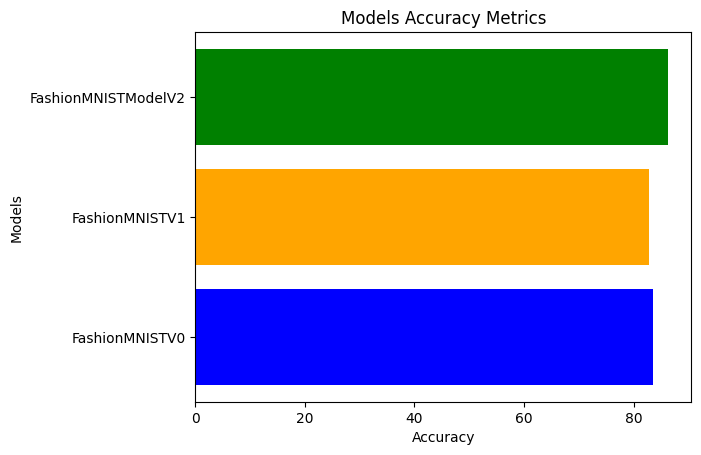

In [ ]:
plt.barh(models_df['model_name'], models_df['model_accuracy'], color=['blue', 'orange', 'green'])
plt.xlabel('Accuracy')
plt.ylabel('Models')
plt.title("Models Accuracy Metrics")
plt.show()

## Save best performing model

In [ ]:
torch.save(model_2.state_dict(), "/content/drive/MyDrive/PyTorch_Learning_Models/model_2.pth")

## Evaluate predictions with best model

In [49]:
def make_predictions(model: torch.nn.Module,
                     data: list,
                     device: torch.device = device):
  pred_probs = []
  model.to(device)
  model.eval()
  with torch.inference_mode():
    for sample in data:
      sample = torch.unsqueeze(sample, dim=0).to(device)

      # Forward pass
      pred_logit = model(sample)
      # Get prediction probability
      pred_prob = torch.nn.functional.softmax(pred_logit.squeeze(), dim=0)
      pred_probs.append(pred_prob.cpu())

  # Stack the pred_probs to turn list into a tensor
  return torch.stack(pred_probs)

In [ ]:
import random

test_samples = []
test_labels = []
for sample, label in random.sample(list(test_data), k=9):
  test_samples.append(sample)
  test_labels.append(label)

test_samples[0].shape, test_labels[0]

(torch.Size([1, 28, 28]), 6)

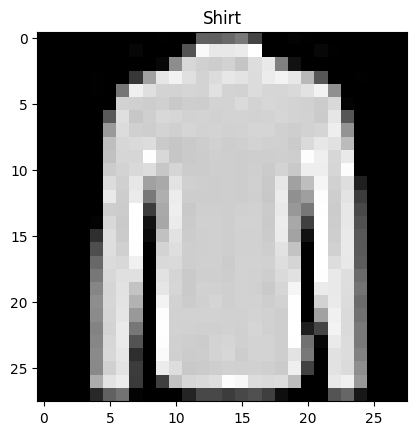

In [ ]:
plt.imshow(test_samples[0].squeeze(), cmap="gray")
plt.title(CLASS_NAMES[test_labels[0]])
plt.show()

In [ ]:
# Make predictions
pred_probs = make_predictions(model_2,
                              test_samples)
# View first two prediction probabilities
pred_probs.shape, pred_probs[:2]

(torch.Size([9, 10]),
 tensor([[9.1285e-04, 1.1282e-05, 7.2621e-02, 9.5145e-04, 8.9747e-02, 2.1683e-08,
          8.3450e-01, 7.0530e-11, 1.2533e-03, 1.2031e-08],
         [8.5774e-01, 2.5043e-06, 9.7593e-04, 1.5401e-04, 6.1426e-08, 6.5867e-07,
          1.4083e-01, 1.4945e-08, 2.9836e-04, 1.8519e-09]]))

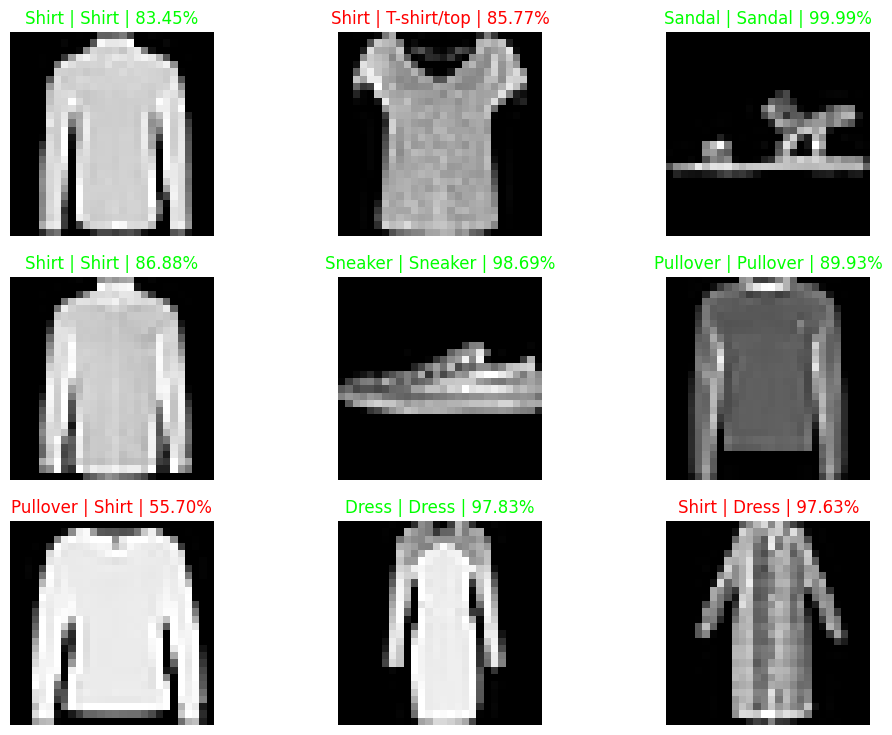

In [ ]:
# Visualize some random images
fig = plt.figure(figsize=(12, 9))
rows, cols = 3,3
counter = 0
for i in range(1, rows*cols+1):
  image = test_samples[counter]
  label = test_labels[counter]
  probability = pred_probs[counter].max() * 100
  predicted_label = CLASS_NAMES[pred_probs[counter].argmax()]
  fig.add_subplot(rows, cols, i)
  plt.imshow(image.squeeze(), cmap="gray")
  color = "#00FF00" if CLASS_NAMES[label] == predicted_label else "#FF0000"
  plt.title(f"{CLASS_NAMES[label]} | {predicted_label} | {probability:.2f}%", color=color)
  plt.axis("off")
  counter += 1
plt.show()

## Creating Confusion Matrix

In [ ]:
# # If torchmetrics package is not installed run:
# !pip install torchmetrics

In [ ]:
list(test_data)

[(tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000],
           [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
            0.0000, 0.0000, 0

In [ ]:
len(test_data)

10000

In [ ]:
test_images, test_labels = [], []
for i in tqdm(range(len(test_data))):
  test_images.append(test_data[i][0])
  test_labels.append(test_data[i][1])

all_predictions = make_predictions(model_2, test_images).argmax(dim=1).squeeze()
all_predictions[:10]

100%|██████████| 10000/10000 [00:02<00:00, 4818.20it/s]


tensor([9, 2, 1, 1, 6, 1, 4, 6, 5, 7])

In [ ]:
all_predictions[:10], test_labels[:10]

(tensor([9, 2, 1, 1, 6, 1, 4, 6, 5, 7]), [9, 2, 1, 1, 6, 1, 4, 6, 5, 7])

In [ ]:
from torchmetrics import ConfusionMatrix

confmat = ConfusionMatrix(task="multiclass", num_classes=len(CLASS_NAMES))
confusion_matrix = confmat(torch.tensor(all_predictions), torch.tensor(test_labels))

<ipython-input-120-4e9c6cbea29d>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  confusion_matrix = confmat(torch.tensor(all_predictions), torch.tensor(test_labels))


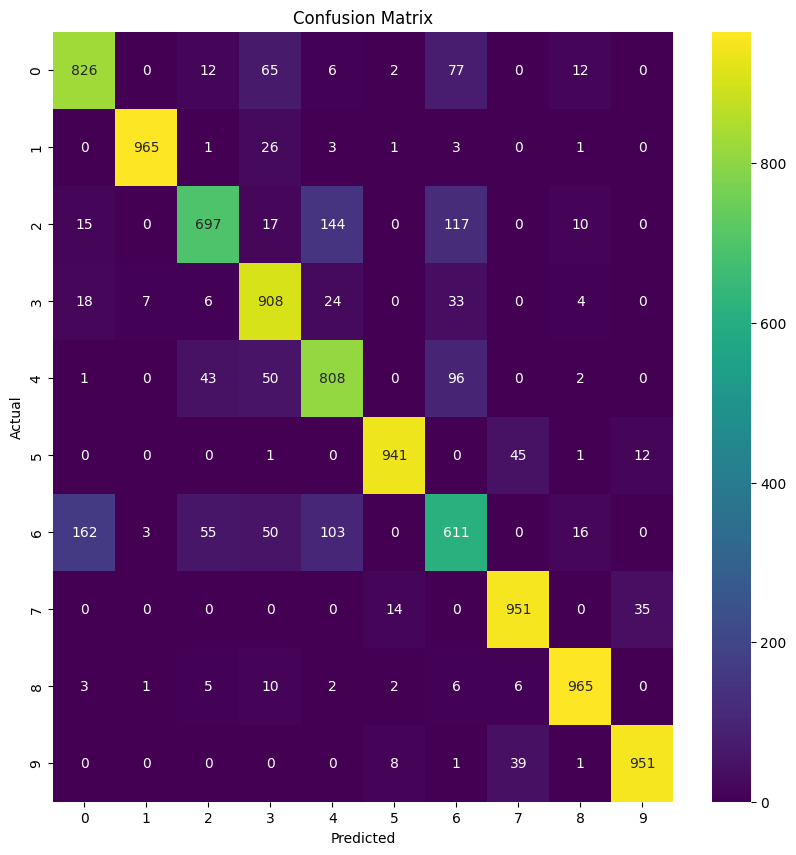

In [ ]:
import seaborn as sn

plt.figure(figsize=(10, 10))
sn.heatmap(confusion_matrix, annot=True, fmt='d', cmap='viridis')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

## Saving and checking best performing model

In [ ]:
from pathlib import Path

def save_model(path, model_name, model):
  model_path = Path(path)
  model_path.mkdir(parents=True,
                   exist_ok=True)
  model_save_path = model_path / model_name
  print(f"Saving model to: {model_save_path}...")
  torch.save(model.state_dict(), model_save_path)

save_model("models", "model_2.pth", model_2)

To check if our model was saved correctly we can use **np.is_close()** to compare predictions of original and loaded model

# Exercises

In [106]:
train_data = datasets.FashionMNIST(root="data", # Where download our data
                                   train=True,
                                   download=True,
                                   transform=ToTensor(), # How to transform images
                                   target_transform=None) # For labels
test_data = datasets.FashionMNIST(root="data",
                                  train=False,
                                  download=True,
                                  transform=ToTensor(),
                                  target_transform=None)
train_data, test_data

(Dataset FashionMNIST
     Number of datapoints: 60000
     Root location: data
     Split: Train
     StandardTransform
 Transform: ToTensor(),
 Dataset FashionMNIST
     Number of datapoints: 10000
     Root location: data
     Split: Test
     StandardTransform
 Transform: ToTensor())

In [107]:
from torchvision.transforms import ToTensor
from torchvision import datasets
import torchvision
import torch

mnist_train = torchvision.datasets.MNIST(root="data",
                    train=True,
                    download=True,
                    transform=ToTensor(),
                    target_transform=None)
mnist_test = torchvision.datasets.MNIST(root="data",
                          train=False,
                          download=True,
                          transform=ToTensor(),
                          target_transform=None)
mnist_train, mnist_test

(Dataset MNIST
     Number of datapoints: 60000
     Root location: data
     Split: Train
     StandardTransform
 Transform: ToTensor(),
 Dataset MNIST
     Number of datapoints: 10000
     Root location: data
     Split: Test
     StandardTransform
 Transform: ToTensor())

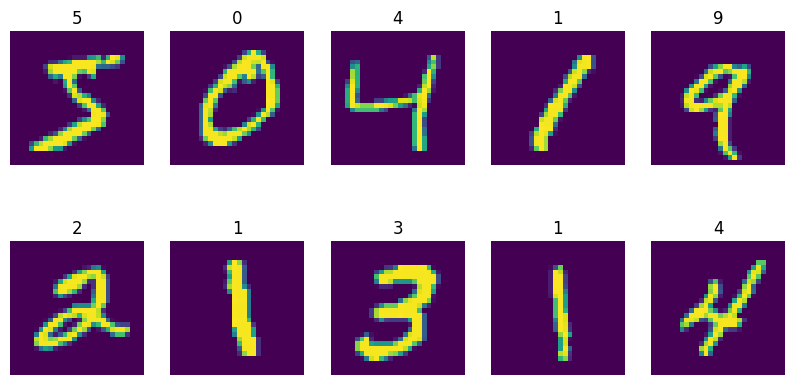

In [108]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 5))
for i in range(10):
  image, label = mnist_train[i]
  fig.add_subplot(2, 5, i+1)
  plt.imshow(image[0])
  plt.title(label)
  plt.axis("off")
plt.show()

In [109]:
BATCH_SIZE = 32
train_dataloader = torch.utils.data.DataLoader(mnist_train,
                                               batch_size=BATCH_SIZE)
test_dataloader = torch.utils.data.DataLoader(mnist_test,
                                              batch_size=BATCH_SIZE)

for X, y in test_dataloader:
    print(f"Shape of X [N, C, H, W]: {X.shape}")
    print(f"Shape of y: {y.shape} {y.dtype}")
    break

Shape of X [N, C, H, W]: torch.Size([32, 1, 28, 28])
Shape of y: torch.Size([32]) torch.int64


In [110]:
from torch import nn
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")

class TinyVGG(torch.nn.Module):

  def __init__(self,
               input_shape,
               hidden_units,
               output_shape):
    super().__init__()
    self.first_block = nn.Sequential(nn.Conv2d(in_channels=1,
                                               out_channels=hidden_units,
                                               kernel_size=3,
                                               stride=1,
                                               padding=1),
                                     nn.ReLU(),
                                     nn.Conv2d(hidden_units,
                                               hidden_units, 3, 1, 1),
                                     nn.ReLU(),
                                     nn.MaxPool2d(kernel_size=2))
    self.second_block = nn.Sequential(nn.Conv2d(hidden_units,
                                                hidden_units, 3, 1, 1),
                                      nn.ReLU(),
                                      nn.Conv2d(hidden_units,
                                               hidden_units, 3, 1, 1),
                                      nn.ReLU(),
                                      nn.MaxPool2d(kernel_size=2))
    self.classification_layers = nn.Sequential(nn.Flatten(),
                                               nn.Linear(hidden_units*7*7, output_shape))

  def forward(self, x):
    x = self.first_block(x)
    # print(x.shape)
    x = self.second_block(x)
    # print(x.shape)
    x = self.classification_layers(x)
    # print(x.shape)
    return x

tinyVGG_model = TinyVGG([1, 28, 28],
                        10,
                        10).to(device)

dummy_x = torch.rand(size=[1, 1, 28, 28]).to(device)
with torch.inference_mode():
  pred = tinyVGG_model(dummy_x)
torch.nn.functional.softmax(pred).argmax().item()

Device: cuda


<ipython-input-110-cde18ddbd589>:48: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  torch.nn.functional.softmax(pred).argmax().item()


4

In [111]:
from tqdm import tqdm
optimizer = torch.optim.SGD(tinyVGG_model.parameters(),
                            momentum=0.9,
                            nesterov=True)
loss_fn = torch.nn.CrossEntropyLoss()
EPOCHS=10
train_step(EPOCHS,
           train_dataloader,
           tinyVGG_model,
           optimizer,
           loss_fn,
           device)

test_loss, test_acc = test_step(tinyVGG_model,
                                test_dataloader,
                                loss_fn,
                                device)

  0%|          | 0/10 [00:00<?, ?it/s]


Epoch: 1
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 10%|█         | 1/10 [00:13<01:57, 13.04s/it]

Train loss: 1.13045334815979

Epoch: 2
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 20%|██        | 2/10 [00:25<01:42, 12.85s/it]

Train loss: 0.1470452845096588

Epoch: 3
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 30%|███       | 3/10 [00:37<01:27, 12.45s/it]

Train loss: 0.10056228935718536

Epoch: 4
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 40%|████      | 4/10 [00:49<01:13, 12.33s/it]

Train loss: 0.08265256136655807

Epoch: 5
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 50%|█████     | 5/10 [01:01<01:01, 12.21s/it]

Train loss: 0.07228341698646545

Epoch: 6
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 60%|██████    | 6/10 [01:13<00:48, 12.08s/it]

Train loss: 0.0651969388127327

Epoch: 7
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 70%|███████   | 7/10 [01:25<00:36, 12.06s/it]

Train loss: 0.059905633330345154

Epoch: 8
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 80%|████████  | 8/10 [01:37<00:23, 11.94s/it]

Train loss: 0.055770862847566605

Epoch: 9
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


 90%|█████████ | 9/10 [01:49<00:12, 12.14s/it]

Train loss: 0.052349694073200226

Epoch: 10
Looked at 32/60000
Looked at 12832/60000
Looked at 25632/60000
Looked at 38432/60000
Looked at 51232/60000


100%|██████████| 10/10 [02:01<00:00, 12.16s/it]

Train loss: 0.04939734935760498



Test loss: 0.05272231996059418 | Test accuracy: 98.15295527156549


In [112]:
print(f"Test loss: {test_loss:.3f} | Test accuracy: {test_acc:.3f}")

Test loss: 0.053 | Test accuracy: 98.153


In [113]:
import random

test_samples = []
test_labels = []
for sample, label in random.sample(list(mnist_test), k=9):
  test_samples.append(sample)
  test_labels.append(label)

test_samples[0].shape, test_labels[0]

(torch.Size([1, 28, 28]), 7)

In [114]:
for image, label in test_dataloader:
  print(image.shape)
  print(label)
  break

torch.Size([32, 1, 28, 28])
tensor([7, 2, 1, 0, 4, 1, 4, 9, 5, 9, 0, 6, 9, 0, 1, 5, 9, 7, 3, 4, 9, 6, 6, 5,
        4, 0, 7, 4, 0, 1, 3, 1])


In [115]:
# Make predictions
pred_probs = make_predictions(tinyVGG_model,
                              test_samples)
# View first two prediction probabilities
pred_probs.shape, pred_probs[:2]

(torch.Size([9, 10]),
 tensor([[4.4480e-12, 3.5960e-09, 3.7541e-08, 2.2126e-08, 1.9307e-11, 2.7371e-11,
          9.6463e-21, 9.9999e-01, 1.0090e-10, 1.1556e-05],
         [5.4198e-09, 9.9996e-01, 3.2386e-07, 3.5509e-07, 2.9395e-05, 2.8179e-08,
          5.8016e-08, 8.1781e-06, 2.5148e-06, 5.9713e-07]]))

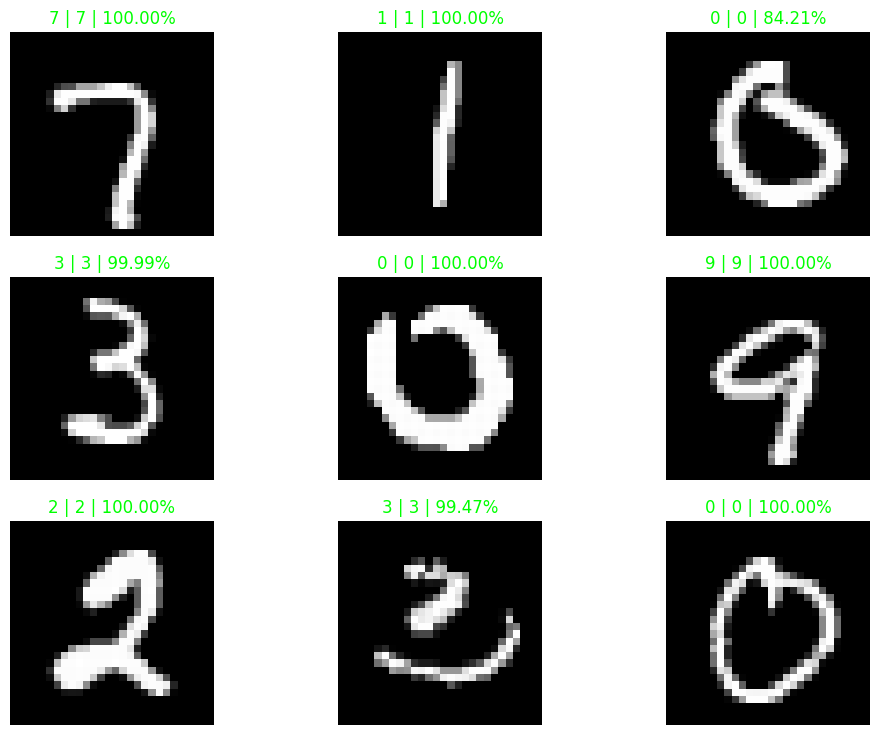

In [116]:
# Visualize some random images
fig = plt.figure(figsize=(12, 9))
rows, cols = 3,3
counter = 0
for i in range(1, rows*cols+1):
  image = test_samples[counter]
  label = test_labels[counter]
  probability = pred_probs[counter].max() * 100
  predicted_label = pred_probs[counter].argmax()
  fig.add_subplot(rows, cols, i)
  plt.imshow(image.squeeze(), cmap="gray")
  color = "#00FF00" if label == predicted_label else "#FF0000"
  plt.title(f"{label} | {predicted_label} | {probability:.2f}%", color=color)
  plt.axis("off")
  counter += 1
plt.show()

In [117]:
# !pip install torchmetrics

In [130]:
from torchmetrics import ConfusionMatrix

test_images, test_labels = [], []
for i in tqdm(range(len(mnist_test))):
  test_images.append(mnist_test[i][0])
  test_labels.append(mnist_test[i][1])

all_predictions = make_predictions(tinyVGG_model, test_images).argmax(dim=1).squeeze()
all_predictions[:10]

100%|██████████| 10000/10000 [00:02<00:00, 4595.18it/s]


tensor([7, 2, 1, 0, 4, 1, 4, 9, 5, 9])

In [131]:
confmat = ConfusionMatrix(task="multiclass", num_classes=10)
confusion_matrix = confmat(torch.tensor(all_predictions), torch.tensor(test_labels))
confusion_matrix

<ipython-input-131-c019ff01114b>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  confusion_matrix = confmat(torch.tensor(all_predictions), torch.tensor(test_labels))


tensor([[ 976,    0,    0,    0,    0,    0,    1,    1,    2,    0],
        [   0, 1131,    1,    0,    1,    1,    0,    0,    1,    0],
        [   3,    4, 1011,    4,    1,    0,    0,    2,    7,    0],
        [   1,    0,    2,  989,    0,   12,    0,    2,    3,    1],
        [   0,    0,    1,    0,  972,    0,    1,    1,    2,    5],
        [   2,    0,    0,    2,    0,  882,    1,    1,    4,    0],
        [   6,    3,    0,    1,    2,   16,  927,    0,    3,    0],
        [   1,    4,   12,    0,    0,    1,    0, 1002,    1,    7],
        [   3,    1,    3,    4,    2,    5,    0,    2,  951,    3],
        [   4,    5,    0,    1,   10,    6,    0,    7,    2,  974]])

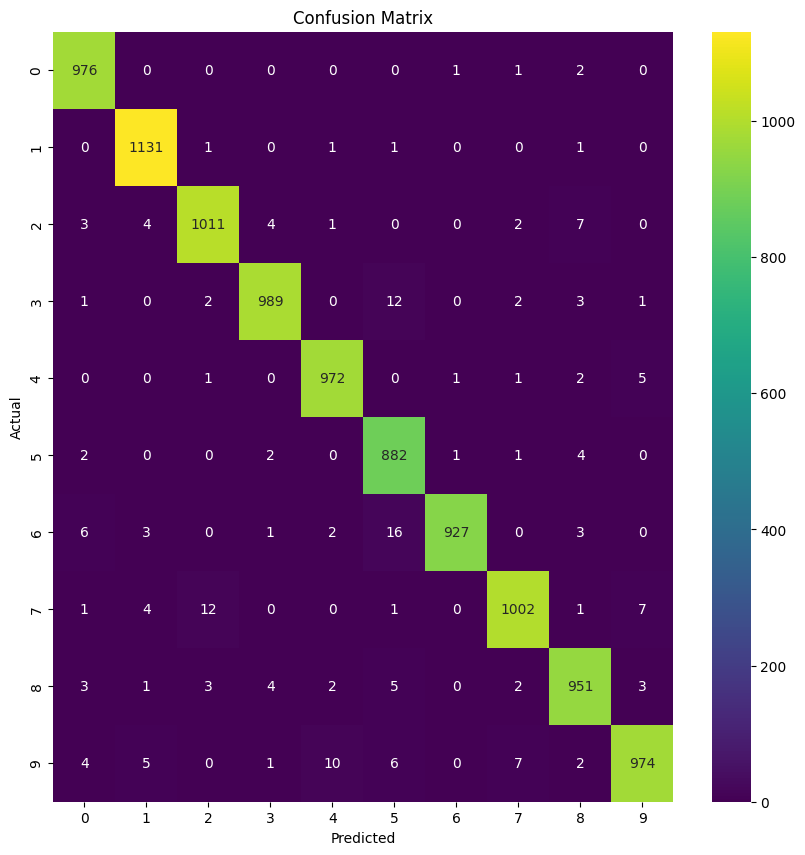

In [132]:
import seaborn as sn

plt.figure(figsize=(10, 10))
sn.heatmap(confusion_matrix, annot=True, fmt='d', cmap='viridis')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()